In [1]:
# libraries
import io
import os
from datetime import datetime
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from sklearn import metrics

# Matplotlib configuration
font = { 'family': 'DejaVu Sans', 'weight': 'bold', 'size': 16 }
plt.rc('font', **font)

In [2]:
# set random seed
np.random.seed(seed=42)

## Reading dataset

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!cp -r ./drive/MyDrive/data_2025 /content/
import os
PATH = f"./data_2025/2025"

In [5]:
print(os.listdir(PATH))
parquet_filenames_train = os.listdir(os.path.join(PATH, "train"))
parquet_filenames_test = os.listdir(os.path.join(PATH, "test"))

['train', '.DS_Store', 'test']


In [6]:
print(parquet_filenames_train)
print(parquet_filenames_test)

['part-00246-of-00362.parquet.parquet', 'part-00296-of-00362.parquet.parquet', 'part-00172-of-00362.parquet.parquet', 'part-00291-of-00362.parquet.parquet', 'part-00268-of-00362.parquet.parquet', 'part-00300-of-00362.parquet.parquet', 'part-00335-of-00362.parquet.parquet', 'part-00287-of-00362.parquet.parquet', 'part-00273-of-00362.parquet.parquet', 'part-00294-of-00362.parquet.parquet', 'part-00025-of-00362.parquet.parquet', 'part-00293-of-00362.parquet.parquet', 'part-00027-of-00362.parquet.parquet', 'part-00324-of-00362.parquet.parquet', 'part-00078-of-00362.parquet.parquet', 'part-00077-of-00362.parquet.parquet', 'part-00354-of-00362.parquet.parquet', 'part-00119-of-00362.parquet.parquet', 'part-00118-of-00362.parquet.parquet', 'part-00259-of-00362.parquet.parquet', 'part-00009-of-00362.parquet.parquet', 'part-00260-of-00362.parquet.parquet', 'part-00108-of-00362.parquet.parquet', 'part-00007-of-00362.parquet.parquet', 'part-00137-of-00362.parquet.parquet', 'part-00168-of-00362.par

# Dataset

In [7]:
parquet_filenames_train[:3]

['part-00246-of-00362.parquet.parquet',
 'part-00296-of-00362.parquet.parquet',
 'part-00172-of-00362.parquet.parquet']

In [8]:
f"Number of files in train: {len(parquet_filenames_train):,}"

'Number of files in train: 362'

In [9]:
parquet_filenames_test[:3]

['part-00246-of-00362.parquet.parquet',
 'part-00296-of-00362.parquet.parquet',
 'part-00172-of-00362.parquet.parquet']

In [10]:
f"Number of files in test: {len(parquet_filenames_test):,}"

'Number of files in test: 362'

# Exploratory Data Analysis

**Training Dataset**

In [11]:
def read_data(folder, filenames):
    """ Read parquet data from mutiple files """

    dataframes = [
        pd.read_parquet(f"{PATH}/{folder}/{filename}")
        for filename in filenames
    ]

    return pd.concat(dataframes)

In [12]:
df_train = read_data("train", parquet_filenames_train)

In [13]:
f"Number of rows in train: {len(df_train):,}"

'Number of rows in train: 229,624'

In [14]:
f"Number of unique products in train: {len(df_train['product_id'].unique()):,}"

'Number of unique products in train: 229,624'

In [15]:
f"Number of columns in train: {len(df_train.columns):,}"

'Number of columns in train: 23'

In [16]:
list(df_train.columns)

['product_id',
 'title',
 'description',
 'tags',
 'type',
 'room',
 'craft_type',
 'recipient',
 'material',
 'occasion',
 'holiday',
 'art_subject',
 'style',
 'shape',
 'pattern',
 'bottom_category_id',
 'bottom_category_text',
 'top_category_id',
 'top_category_text',
 'primary_color_id',
 'primary_color_text',
 'secondary_color_id',
 'secondary_color_text']

In [17]:
df_train.iloc[0]

,0
product_id,1606929317
title,"Dendrite Opal Octagon Earring, Gold Plated Smo..."
description,Dive into the ocean of serenity & yin energy o...
tags,"DIY jewelry,slab slice connector,thick connect..."
type,physical
room,
craft_type,
recipient,
material,
occasion,


In [18]:
df_train.head(100)

,product_id,title,description,tags,type,room,craft_type,recipient,material,occasion,...,shape,pattern,bottom_category_id,bottom_category_text,top_category_id,top_category_text,primary_color_id,primary_color_text,secondary_color_id,secondary_color_text
0,1606929317,"Dendrite Opal Octagon Earring, Gold Plated Smo...",Dive into the ocean of serenity & yin energy o...,"DIY jewelry,slab slice connector,thick connect...",physical,,,,,,...,,,6297,craft_supplies_and_tools.findings.ear_hoops,6,craft_supplies_and_tools,17,white,1,black
1,1644723077,"Thick Round Huggie Earrings, Gold Round Huggie...","Thick Round Huggie Earrings, Gold Round Huggie...","18K Gold Hoop,Gold Hoop Earrings,Huggie Hoop E...",physical,,beading,,,,...,,,6297,craft_supplies_and_tools.findings.ear_hoops,6,craft_supplies_and_tools,7,gold,7,gold
2,259755757,10 Silver Wine Glass Charms Hoop Earrings Silv...,Set of 10 silver plated earring hoops or wine ...,"Destash,Wine glass charms,Wine glass rings,Win...",physical,,beading,,,,...,,,6297,craft_supplies_and_tools.findings.ear_hoops,6,craft_supplies_and_tools,16,silver,7,gold
3,1646981149,"Brass Round Huggie Earring, White Circle Huggi...","Brass Round Huggie Earring, White Circle Huggi...","Huggie Hoop Earring,Earring With Loop,Brass Ho...",physical,,beading,,,,...,,,6297,craft_supplies_and_tools.findings.ear_hoops,6,craft_supplies_and_tools,17,white,17,white
4,644005549,6pcs 10pcs 30mm Sterling Silver Sparkling Roun...,30mm 925 sterling silver sparkling hoop earrin...,"earring,20mm,round beading hoop,earring wire,e...",physical,,beading,,,,...,,,6297,craft_supplies_and_tools.findings.ear_hoops,6,craft_supplies_and_tools,16,silver,16,silver
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,509903859,Sweet Lies Flower Power Silver Golf Shirt,"This silver polo shirt screams late nineties, ...","gothic,clubkid,club,rave,flower power,butterfl...",physical,,,,,,...,,,557,clothing.womens_clothing.tops_and_tees.polos,5,clothing,16,silver,1,black
1,1311017577,Women&#39;s Vintage 80s Lacoste Izod Blue Whit...,Selling a Women&#39;s Vintage 80s Lacoste Izod...,"izod,lacoste,womens,ladies,made in usa,vintage...",physical,,,,,,...,,striped,557,clothing.womens_clothing.tops_and_tees.polos,5,clothing,2,blue,17,white
2,1287540896,Vintage 80s Knit Polo | Size PL | White Knitte...,Vintage knitted short sleeve polo shirt by Alf...,"vintage shirt,vintage polo,polo shirt,short sl...",physical,,,,,,...,,polka dot,557,clothing.womens_clothing.tops_and_tees.polos,5,clothing,17,white,14,red
3,923161429,moschino cheapandchic,"moschino cheap and chic vintage 1980s jersey, ...",,physical,,,,,,...,,solid,557,clothing.womens_clothing.tops_and_tees.polos,5,clothing,10,orange,10,orange


In [19]:
df_train['type'].unique()

array(['physical', 'download', ''], dtype=object)

In [20]:
df_train['type'].value_counts(dropna=False)

,count
type,
physical,218568
download,10708
,348


In [21]:
f"Number of top categories in train: {len(df_train['top_category_text'].unique()):,}"

'Number of top categories in train: 15'

In [22]:
pd.value_counts(df_train['top_category_text'], sort=True, ascending=False)

<ipython-input-22-32be510a6e5e>:1: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  pd.value_counts(df_train['top_category_text'], sort=True, ascending=False)


,count
top_category_text,
home_and_living,54600
craft_supplies_and_tools,33393
clothing,30143
toys_and_games,13835
accessories,12416
paper_and_party_supplies,12207
bath_and_beauty,11327
weddings,10143
shoes,8892


<ipython-input-23-d74ddfbffba3>:9: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  pd.value_counts(


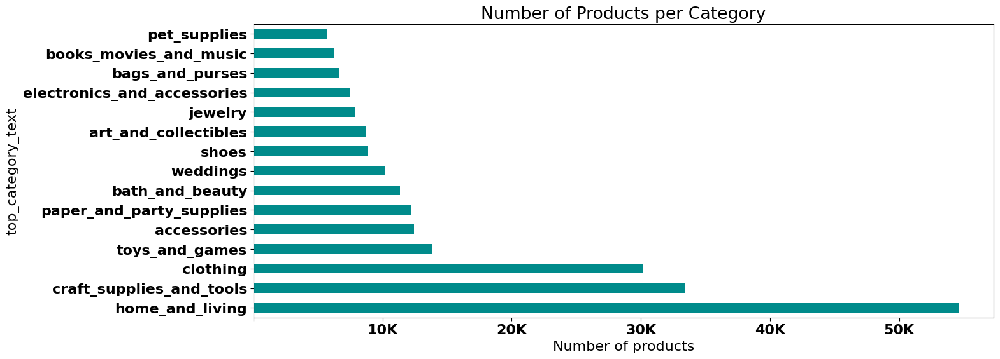

In [23]:
#visualize the number of products per 'top_category_text' in train data
figsize = (15, 6)
column = 'top_category_text'
x_limit = 60000
x_step = 10000
color = 'darkcyan'

figure, ax = plt.subplots(figsize=figsize)
pd.value_counts(
    df_train[column],
    sort=True, ascending=False).plot.barh(color=color)
plt.title(f"Number of Products per Category")
xlabels = [f'{x // 1000:,}K' for x in range(0, x_limit, x_step)]
plt.xticks(range(0, x_limit, x_step), xlabels)
plt.xlabel('Number of products')
plt.setp(ax.get_xticklabels()[0], visible=False)
plt.show()

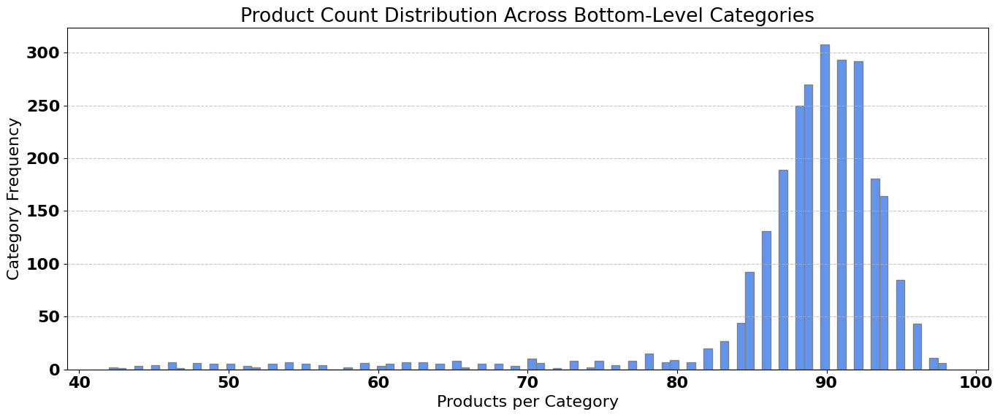

In [24]:
# Visualizing how many products are in each bottom-level category
product_counts = df_train['bottom_category_text'].value_counts()

plt.figure(figsize=(14, 6))
plt.hist(product_counts.values, bins=100, color='cornflowerblue', edgecolor='gray')
plt.title("Product Count Distribution Across Bottom-Level Categories")
plt.xlabel("Products per Category")
plt.ylabel("Category Frequency")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [25]:
f"Number of bottom categories in train: {len(df_train['bottom_category_text'].unique()):,}"

'Number of bottom categories in train: 2,609'

## **Test Dataset**

In [26]:
df_test = read_data("test", parquet_filenames_test)

In [27]:
f'Number of rows in test: {len(df_test):,}'

'Number of rows in test: 25,514'

In [28]:
f"Number of unique products in test: {len(df_test['product_id'].unique()):,}"

'Number of unique products in test: 25,514'

In [29]:
f"Number of columns in test: {len(df_test.columns):,}"

'Number of columns in test: 15'

In [30]:
list(df_test.columns)

['product_id',
 'title',
 'description',
 'tags',
 'type',
 'room',
 'craft_type',
 'recipient',
 'material',
 'occasion',
 'holiday',
 'art_subject',
 'style',
 'shape',
 'pattern']

In [31]:
df_test.iloc[0]

,0
product_id,630162350
title,4 drawer Refinished Metal Filing Cabinet with ...
description,"Beautiful, restored 4 Drawer metal filing cabi..."
tags,"office furniture,metal filing cabinet,industri..."
type,physical
room,
craft_type,
recipient,
material,
occasion,


# **Checking missing values**
droping style,material,craft_type,occasinon as too much missing value

In [68]:
columns_to_check = ['title', 'description', 'tags', 'style', 'occasion', 'material', 'craft_type']

# Count total missing values (NaN or empty strings)
missing_counts = (df_train[columns_to_check].isnull() | (df_train[columns_to_check] == '')).sum().sort_values(ascending=False)

# Percentage of missing values
missing_percentages = ((df_train[columns_to_check].isnull() | (df_train[columns_to_check] == '')).mean() * 100).sort_values(ascending=False)

# Display results
print(" Missing Value Counts (NaN or '')")
print(missing_counts)

print("\n Missing Value Percentages (NaN or '')")
print(missing_percentages)


 Missing Value Counts (NaN or '')
style          213730
material       209384
craft_type     201862
occasion       171550
tags            31169
description       810
title             810
dtype: int64

 Missing Value Percentages (NaN or '')
style          93.078250
material       91.185590
craft_type     87.909800
occasion       74.709090
tags           13.573930
description     0.352751
title           0.352751
dtype: float64


## Model Training

Let's first split the data to be able to evaluate our model against a validation dataset. This validation set can also be used to fine tune your model before making the predictions on the hidden test set.

In [33]:
from sklearn.model_selection import train_test_split

df_training, df_validation = train_test_split(
    df_train,
    test_size=0.1,
    stratify=df_train['bottom_category_text'],
    random_state=42)

In [34]:
f"Number of products for training: {len(df_training):,}"

'Number of products for training: 206,661'

In [35]:
f"Number of products for validation: {len(df_validation):,}"

'Number of products for validation: 22,963'

In [36]:
df_training['bottom_category_text'].value_counts()

,count
bottom_category_text,
accessories.scarves_and_wraps.scarves,88
jewelry.earrings.dangle_earrings.chandbalis,88
craft_supplies_and_tools.closures_and_fasteners.buttons,88
toys_and_games.sports_and_outdoor_games.martial_arts_and_boxing.boxing_gloves,88
home_and_living.kitchen_and_dining.dining_and_serving.cake_stands,88
...,...
clothing.girls_clothing.baby_girls_clothing.socks_and_leg_warmers,40
weddings.clothing.jumpsuits_and_rompers,40
home_and_living.lighting.light_accessories,39


In [37]:
df_validation['bottom_category_text'].value_counts()

,count
bottom_category_text,
toys_and_games.toys.baby_and_toddler_toys.shapes_and_colors,10
home_and_living.food_and_drink.snacks,10
clothing.womens_clothing.jeans,10
home_and_living.spirituality_and_religion.religious_home_and_decor.thali_and_thali_sets,10
art_and_collectibles.fiber_arts.quilting,10
...,...
home_and_living.furniture.entryway_furniture.standing_coat_racks,4
craft_supplies_and_tools.doll_and_model_supplies.noise_makers,4
clothing.girls_clothing.baby_girls_clothing.socks_and_leg_warmers,4


In [38]:
df_training['top_category_text'].value_counts()

,count
top_category_text,
home_and_living,49140
craft_supplies_and_tools,30056
clothing,27139
toys_and_games,12448
accessories,11173
paper_and_party_supplies,10984
bath_and_beauty,10187
weddings,9128
shoes,8001


In [39]:
df_validation['top_category_text'].value_counts()

,count
top_category_text,
home_and_living,5460
craft_supplies_and_tools,3337
clothing,3004
toys_and_games,1387
accessories,1243
paper_and_party_supplies,1223
bath_and_beauty,1140
weddings,1015
shoes,891


# Training

In [40]:
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, classification_report

# === Step 1: Create 'combined_text' in train, validation
for df in [df_training, df_validation]:
    df["combined_text"] = (
        df["title"].fillna('') + " " +
        df["description"].fillna('') + " " +
        df["tags"].fillna('').apply(lambda x: ' '.join(x) if isinstance(x, list) else x)
    )

for top category

In [41]:
# Extract features and labels for top category
train_text = df_training['combined_text'].values
train_labels = df_training['top_category_text'].values

val_text = df_validation['combined_text'].values
val_labels = df_validation['top_category_text'].values


In [42]:
# Define and train pipeline
text_clf = Pipeline([
    ('tfidf', TfidfVectorizer(
        stop_words='english',
        ngram_range=(1, 2),
        min_df=2,
        max_features=15000
    )),
    ('clf', LogisticRegression(
        max_iter=1000,
        solver='liblinear',
        class_weight='balanced',
        C=1.2
    ))
])

#  Fit model
text_clf.fit(train_text, train_labels)


Pipeline(steps=[('tfidf',
                 TfidfVectorizer(max_features=15000, min_df=2,
                                 ngram_range=(1, 2), stop_words='english')),
                ('clf',
                 LogisticRegression(C=1.2, class_weight='balanced',
                                    max_iter=1000, solver='liblinear'))])

In [67]:
# Predict and evaluate
predictions = text_clf.predict(val_text)
f1 = metrics.f1_score(val_labels, predictions, average='weighted')

precision = metrics.precision_score(val_labels, predictions, average='weighted', zero_division=0)
recall = metrics.recall_score(val_labels, predictions, average='weighted', zero_division=0)

# Print metrics
print(f"F1 score (Top Category): {f1:.4f}")
print(f"Precision (weighted):    {precision:.4f}")
print(f"Recall (weighted):       {recall:.4f}")


F1 score (Top Category): 0.0001
Precision (weighted):    0.0000
Recall (weighted):       0.0047


In [45]:
# Full classification report
print("\n Classification Report:")
print(metrics.classification_report(val_labels, predictions, zero_division=0))


📋 Classification Report:
                             precision    recall  f1-score   support

                accessories       0.79      0.82      0.81      1243
       art_and_collectibles       0.66      0.72      0.69       870
            bags_and_purses       0.82      0.89      0.85       664
            bath_and_beauty       0.87      0.88      0.87      1140
     books_movies_and_music       0.82      0.91      0.86       626
                   clothing       0.96      0.95      0.95      3004
   craft_supplies_and_tools       0.88      0.81      0.84      3337
electronics_and_accessories       0.86      0.90      0.88       747
            home_and_living       0.89      0.88      0.88      5460
                    jewelry       0.81      0.92      0.86       782
   paper_and_party_supplies       0.80      0.85      0.83      1223
               pet_supplies       0.89      0.93      0.91       574
                      shoes       0.94      0.97      0.95       891
       

**For bottom category id**

In [66]:
# Extract features and labels for bottom category
train_text = df_training['combined_text'].values
train_labels = df_training['bottom_category_text'].values

val_text = df_validation['combined_text'].values
val_labels = df_validation['bottom_category_text'].values


In [47]:
# Define and train pipeline for bottom category
bottom_clf = Pipeline([
    ('tfidf', TfidfVectorizer(
        stop_words='english',
        ngram_range=(1, 2),
        min_df=2,
        max_features=15000
    )),
    ('clf', LogisticRegression(
        max_iter=1000,
        solver='saga',
        class_weight='balanced',
        C=1.2
    ))
])

# Train the model
bottom_clf.fit(train_text, train_labels)


Pipeline(steps=[('tfidf',
                 TfidfVectorizer(max_features=15000, min_df=2,
                                 ngram_range=(1, 2), stop_words='english')),
                ('clf',
                 LogisticRegression(C=1.2, class_weight='balanced',
                                    max_iter=1000, solver='saga'))])

In [65]:
#Predict on validation set
bottom_predictions = bottom_clf.predict(val_text)

# Evaluate metrics
f1 = metrics.f1_score(val_labels, bottom_predictions, average='weighted')
precision = metrics.precision_score(val_labels, bottom_predictions, average='weighted', zero_division=0)
recall = metrics.recall_score(val_labels, bottom_predictions, average='weighted', zero_division=0)

# Print metrics
print(f"F1 score (Bottom Category):     {f1:.4f}")
print(f"Precision (weighted):    {precision:.4f}")
print(f"Recall (weighted):       {recall:.4f}")


F1 score (Bottom Category):     0.5907
Precision (weighted):    0.6212
Recall (weighted):       0.6033


In [49]:
# Full classification report
print("\n Classification Report:")
print(metrics.classification_report(val_labels, bottom_predictions, zero_division=0))


 Classification Report:
                                                                                                                        precision    recall  f1-score   support

                                                                                                           accessories       0.00      0.00      0.00         9
                                                                                          accessories.baby_accessories       0.50      0.33      0.40         9
                                                                  accessories.baby_accessories.baby_carriers_and_wraps       0.71      0.56      0.62         9
                                                                    accessories.baby_accessories.childrens_photo_props       0.71      0.56      0.62         9
                                                                                      accessories.belts_and_suspenders       0.67      0.20      0.31        10
              

Final submission

In [69]:
import pandas as pd
import numpy as np

#  Your Student ID
student_id = "13652"

#  Ensure combined_text exists in test data
if 'combined_text' not in df_test.columns:
    df_test["combined_text"] = (
        df_test["title"].fillna('') + " " +
        df_test["description"].fillna('') + " " +
        df_test["tags"].fillna('').apply(lambda x: ' '.join(x) if isinstance(x, list) else x)
    )

#  Copy test data
df_predictions = df_test.copy()
test_text = df_predictions["combined_text"].values

# Predict category text using trained models
df_predictions["top_category_text"] = text_clf.predict(test_text)
df_predictions["bottom_category_text"] = bottom_clf.predict(test_text)

#  Create mapping dictionaries from training data
top_map = df_training.drop_duplicates(subset=["top_category_text", "top_category_id"]).set_index("top_category_text")["top_category_id"].to_dict()
bottom_map = df_training.drop_duplicates(subset=["bottom_category_text", "bottom_category_id"]).set_index("bottom_category_text")["bottom_category_id"].to_dict()

#  Map predicted text labels to IDs
df_predictions["top_category_id"] = df_predictions["top_category_text"].map(top_map).fillna(0).astype(int)
df_predictions["bottom_category_id"] = df_predictions["bottom_category_text"].map(bottom_map).fillna(0).astype(int)

#  Save final file as Parquet with student ID in the filename
output_filename = f"predictions_{student_id}.parquet"
df_predictions[["product_id", "top_category_id", "bottom_category_id"]].to_parquet(output_filename, index=False)

print(f" Submission saved: {output_filename}")


 Submission saved: predictions_13652.parquet


In [57]:
print(df_predictions)

    product_id                                              title  \
0    630162350  4 drawer Refinished Metal Filing Cabinet with ...   
1   1585504640                       Vintage steel filing cabinet   
2   1650585700                       Globe wernicke metal cabinet   
3   1476817460  Renaissance style notary office in solid walnu...   
4   1569697380                             Mini ceramic washbasin   
..         ...                                                ...   
21   954999100  Filigree 2 in 1 Leaf Charms, Gold Filigree Pen...   
22   901595430  Pendentif connecteur tube jaspe paysage doré,p...   
23   837059800  Crescent Earring Charms, Earrings or Bracelet ...   
24   676088050                   1 chakra, ohm/aum brass pendants   
25  1285113880                                 mobile phone chain   

                                          description  \
0   Beautiful, restored 4 Drawer metal filing cabi...   
1   Vintage 15 drawer filing cabinet, sure to make...   


# **Visualization**
visualize some learned representations or embeddings and show that similar items
cluster together


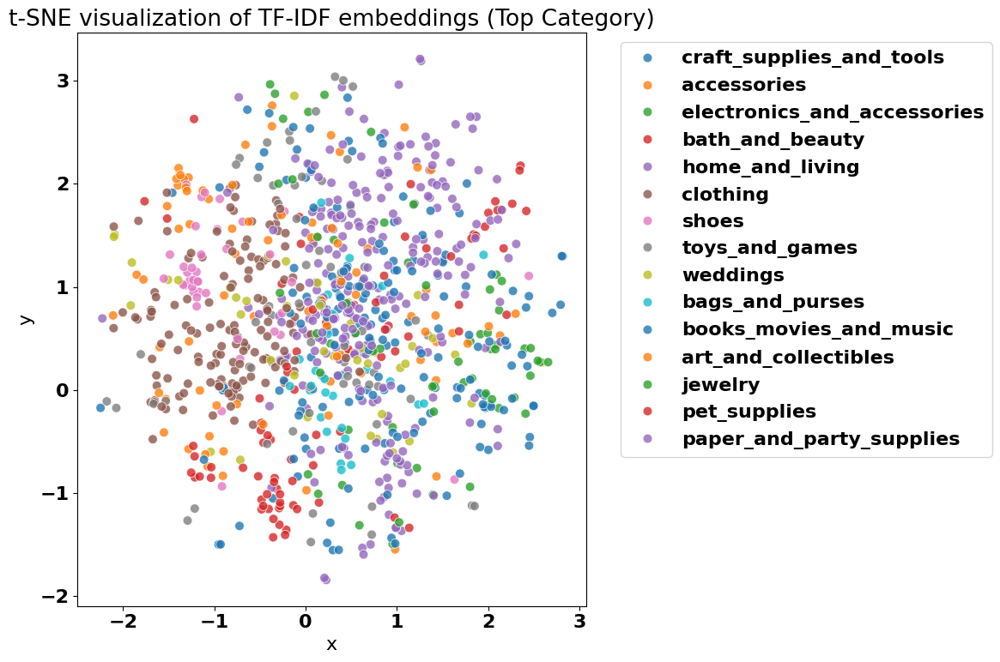

In [63]:
#for top_category_id
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

#  Step 1: Extract TF-IDF vectors from trained pipeline
# This uses the same clean/compressed text input the model trained on
vectorizer = text_clf.named_steps['tfidf']
X_tfidf = vectorizer.transform(df_training["combined_text"].values)

#  Step 2: Apply t-SNE to reduce to 2D
tsne = TSNE(n_components=2, random_state=42, perplexity=50)
X_2d = tsne.fit_transform(X_tfidf[:1000].toarray())  # limit to 1000 for performance

#  Step 3: Plot using Seaborn or Matplotlib
df_viz = pd.DataFrame({
    'x': X_2d[:, 0],
    'y': X_2d[:, 1],
    'label': df_training["top_category_text"].iloc[:1000]  # or bottom_category_text
})

plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_viz, x='x', y='y', hue='label', palette='tab10', s=60, alpha=0.8)
plt.title("t-SNE visualization of TF-IDF embeddings (Top Category)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [64]:
#for bottom_category_id
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

#  Step 1: Extract TF-IDF vectors from trained pipeline
# This uses the same clean/compressed text input the model trained on
vectorizer = bottom_clf.named_steps['tfidf']
X_tfidf = vectorizer.transform(df_training["combined_text"].values)

#  Step 2: Apply t-SNE to reduce to 2D
tsne = TSNE(n_components=2, random_state=42, perplexity=50)
X_2d = tsne.fit_transform(X_tfidf[:1000].toarray())  # limit to 1000 for performance

#  Step 3: Plot using Seaborn or Matplotlib
df_viz = pd.DataFrame({
    'x': X_2d[:, 0],
    'y': X_2d[:, 1],
    'label': df_training["bottom_category_text"].iloc[:1000]  # or bottom_category_text
})

plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_viz, x='x', y='y', hue='label', palette='tab10', s=60, alpha=0.8)
plt.title("t-SNE visualization of TF-IDF embeddings (Bottom Category)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

<ipython-input-64-995f12249f90>:26: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
